# HOMEWORK 2

# <i> How do Taxis move in NYC? </i>

### <i>Authors</i>:  Livia Lilli, Matteo Zmyslowski, Karamiko Alexander Krisna, Remon Rezk

In [1]:
import pandas
#pandas.options.display.width = 50
pandas.options.display.max_colwidth = 30
import numpy 
import matplotlib.mlab 
import matplotlib.pyplot as plt
import numpy as np
from pylab import rcParams
from datetime import datetime
import scipy.stats
import matplotlib as mpl

import seaborn as sns


In [2]:
sns.set(color_codes=True)

In [3]:
from tqdm import tqdm

Let's start opening the <b>csv</b> files we'll need for our analysis using pandas. 

In [4]:
file_lookup = pandas.read_csv(("taxi_zone_lookup.csv"), sep =",", delimiter= None, header = "infer", names = None, index_col = None, usecols = None,
                       encoding="ISO-8859-1")
taxi_zone = pandas.DataFrame(file_lookup)
#print(taxi_zone)

In [5]:
jan = pandas.read_csv(("yellow_tripdata_2018-01.csv"),sep =",", delimiter= None, header = "infer", names = None, index_col = None, usecols = None,
                       encoding="ISO-8859-1")



In [6]:
feb = pandas.read_csv(("/Users/livialilli/Desktop/ADM-HW2/yellow_tripdata_2018-02.csv"),sep =",", delimiter= None, header = "infer", names = None, index_col = None, usecols = None,
                       encoding="ISO-8859-1")

In [7]:
mar = pandas.read_csv(("/Users/livialilli/Desktop/ADM-HW2/yellow_tripdata_2018-03.csv"),sep =",", delimiter= None, header = "infer", names = None, index_col = None, usecols = None,
                       encoding="ISO-8859-1")

In [8]:
apr = pandas.read_csv(("/Users/livialilli/Desktop/ADM-HW2/yellow_tripdata_2018-04.csv"),sep =",", delimiter= None, header = "infer", names = None, index_col = None, usecols = None,
                       encoding="ISO-8859-1")

In [9]:
may = pandas.read_csv(("/Users/livialilli/Desktop/ADM-HW2/yellow_tripdata_2018-05.csv"),sep =",", delimiter= None, header = "infer", names = None, index_col = None, usecols = None,
                       encoding="ISO-8859-1")

In [10]:
june = pandas.read_csv(("/Users/livialilli/Desktop/ADM-HW2/yellow_tripdata_2018-06.csv"),sep =",", delimiter= None, header = "infer", names = None, index_col = None, usecols = None,
                       encoding="ISO-8859-1")

# RQ1

Our first goal is to find the average number of trips recorded each day.

To do this we consider the pickup datetime. In particular, we need just the date, so we extract it from the "tpep_pickup_datetime" fields.

Then we group our dataframe by dates, counting for each date the number of rows dedicated. So, we find the number of trips for each day.

We have noticed, during the process, that there were some filling errors: infact there were lots of dates not corresponding to 2018 year. So we dropped them. 

Now we put the count values for each day in an array and we compute its mean. 

We need to repeat these operations for each month, so for every iteration of the <i>for cicle</i>, we add the mean value of the i-month to a list "l".



In [10]:
months = [jan, feb, mar, apr, may, june]

In [11]:
l = []
m = 1
for month in months:
    
    #taxi_number_trips = month.shape[0]
    #Here I convert the field in datetime format
    month["tpep_pickup_datetime"] = pandas.to_datetime(month["tpep_pickup_datetime"], yearfirst = True)
    month["tpep_dropoff_datetime"] = pandas.to_datetime(month["tpep_dropoff_datetime"])
    
    #Here I add a column with just the pickup dates, without the times
    month["only_pickup_date"] = pandas.to_datetime(month["tpep_pickup_datetime"].dt.date) 
    
    #here there is the query: for every date, I count the number of rows dedicated, and so the number of trips    
    for_date = month.groupby(["only_pickup_date"]).size().reset_index(name="count")
    
    #There are some errors in the doc: there are dates which not correspond to 2018 and to the current month m
    #So I drop them
    for_date = for_date.drop(for_date[(for_date['only_pickup_date'].dt.year != 2018) | (for_date['only_pickup_date'].dt.month != m)].index)
    
    #I create an array with just the "count" values
    arr_count = for_date["count"].values
    
    #Computing the mean...
    mean = arr_count.mean()
    l.append(mean)
    m +=1
print(l)

#l is a list where each element is the daily mean of the m-month
    

[282565.5483870968, 303263.21428571426, 304162.6129032258, 310167.56666666665, 297540.1612903226, 290443.56666666665]


In [12]:
l_array = np.asarray(l)
x = ["jan", "feb", "mar", "apr", "may", "june"]
x_array = np.asarray(x)

Now we represent with a plot the mean value for each month.

For this we create two arrays, one for each coordinate: the first contains the months' names, the second the mean values.

Text(0,0.5,'Mean')

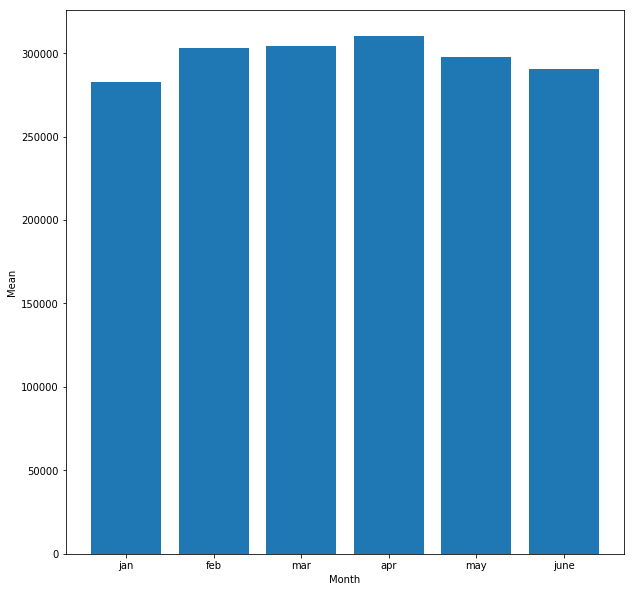

In [13]:
rcParams['figure.figsize'] = [10, 10]
plt.bar(x_array, l_array)
#plt.plot([1,2,3,4,5,6], l)
plt.xlabel("Month")
plt.ylabel("Mean")


It's easy, from the plot, to view the period with the bigger mean of trips overall New York. 

Infact the month of April has got the maximum usage compared to others, and March and February follow it. 

What does it mean? Maybe in this seasons there is a bigger affluence of tourists, who increments the taxis question.

### BOROUGH

Our second goal is to compute the same analysis for each borough.

So, we build a function to compute the mean for every month and to print the corresponding plot. Then we apply this function to every borough.

In [33]:
#I'm creating a function that I'll apply for every borrough

def generaGraficoMese(distretto, colore = "black"):
    months = [jan, feb, mar, apr, may, june]
    media = []
    for m in (months):
        #for every month, it joins the month file with the taxi zone file
        join_tables = m.set_index('PULocationID').join(taxi_zone.set_index('LocationID'))
        #then it groups by borough and date, computing the total of trips for every row
        for_borough = join_tables[join_tables.Borough == distretto].groupby(['Borough','only_pickup_date']).size().reset_index(name="count_tot")
        #then it converts the count column in array, so we can compute the mean
        liv = np.asarray(for_borough.count_tot)
        mean = liv.mean()
        
        media.append(mean)
#now we have a media list, with mean value for every month   
    
    #Stampo media
    x = ["jan", "feb", "mar", "apr", "may", "june"]
    x_array = np.asarray(x)
    rcParams['figure.figsize'] = [10, 10]
    plt.bar(x_array, media, color = colore)
    #plt.plot([1,2,3,4,5,6], l)
    plt.xlabel("Month")
    plt.ylabel("Mean")


### Bronx

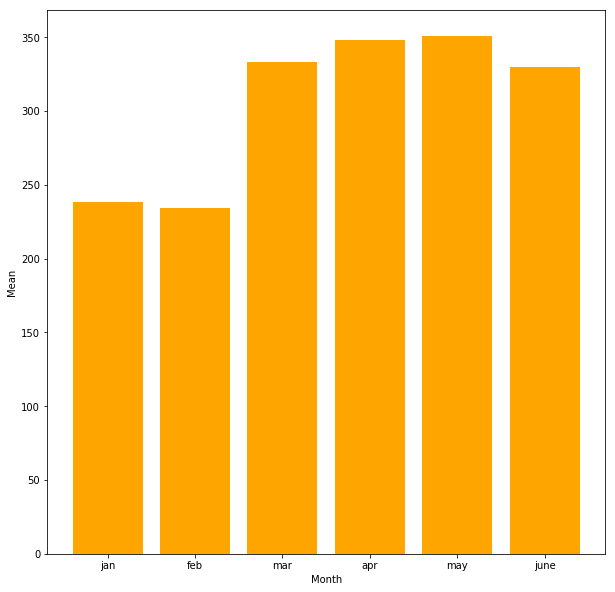

In [34]:
generaGraficoMese("Bronx", "orange")

About Bronx, the period with the maximum usage is May, followed by April.

### Brooklyn

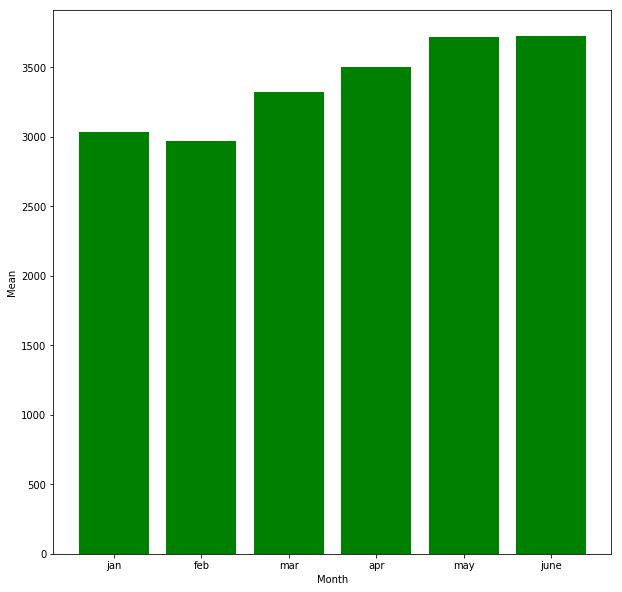

In [35]:
generaGraficoMese("Brooklyn", "green")

About Brooklyn, June and May seem to be the months with the highest mean of trips.

### Manhattan

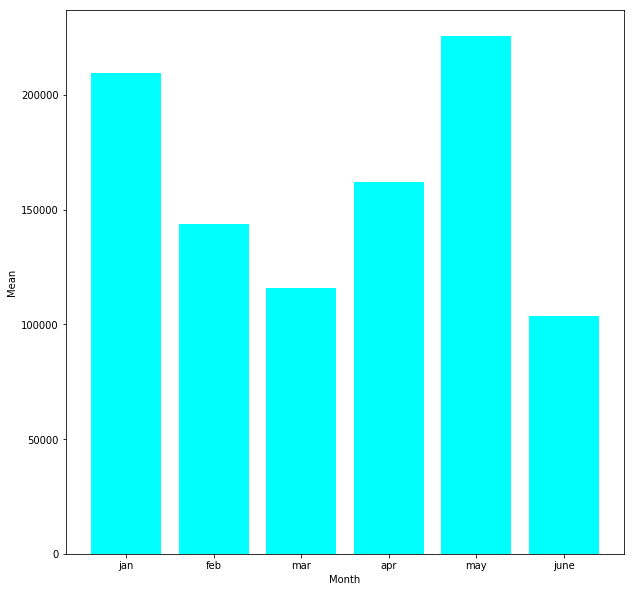

In [36]:
generaGraficoMese("Manhattan", "cyan")

Without doubts for Manhattan, May is the month with the highest mean value. 
We can notice that Manhattan and Queens are the two boroughs with the biggest values of mean respect to others. In these areas there is a greater usage of taxis.

### Queens

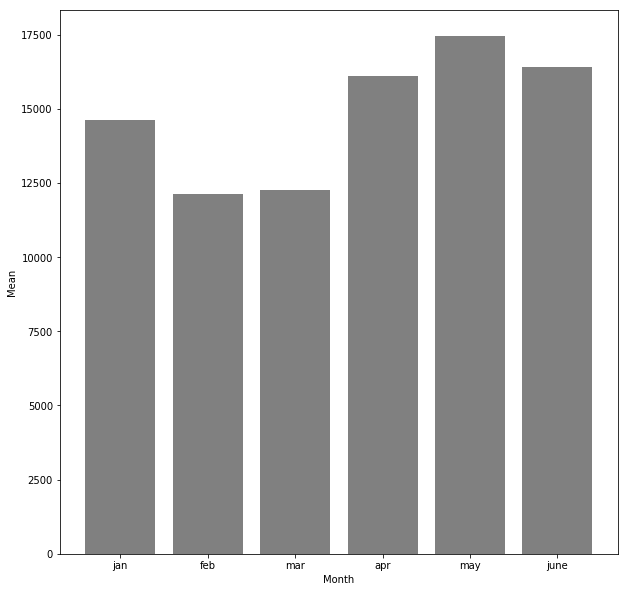

In [37]:
generaGraficoMese("Queens", "grey")

About Queens, May is the period with the biggest value of mean.

### Staten Island

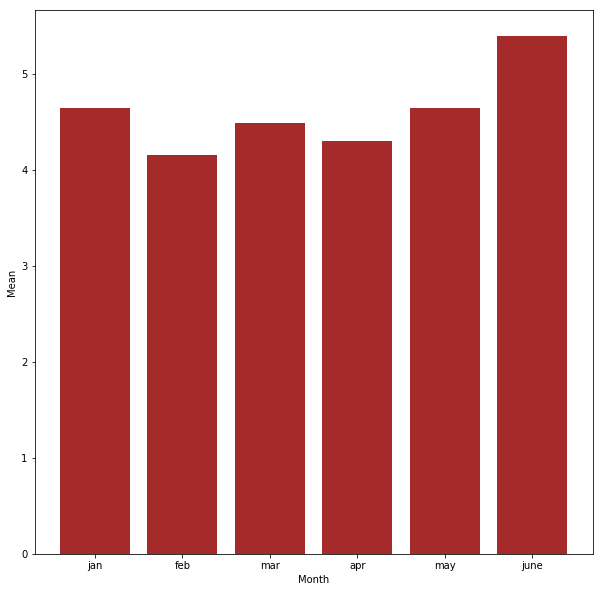

In [38]:
generaGraficoMese("Staten Island", "brown")

The usage level of taxis in Staten Island is really low, comparing it with other boroughs. 
June is the period where the mean is higher.

### Unknown

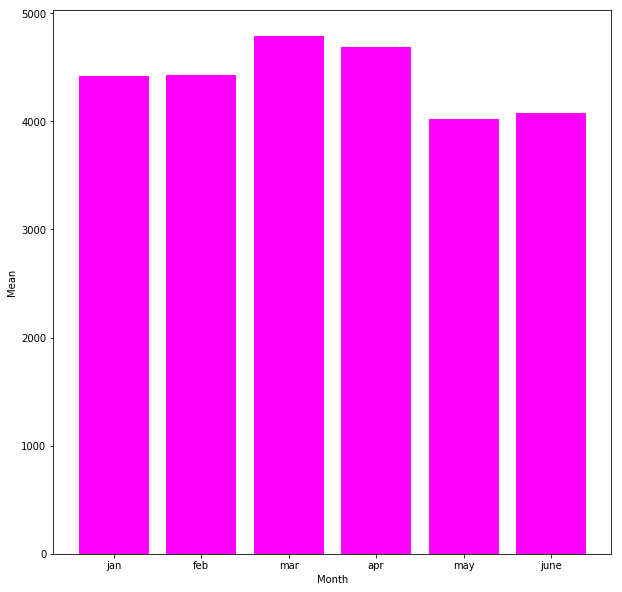

In [39]:
generaGraficoMese("Unknown", "magenta")

Among the various Boroughs, in the "taxi zone" table, there are also unknown values. We decide to consider them with this name, for more realistic results of the mean. 
So for this class of borough, we have a maximum taxis usage in March.

### EWR

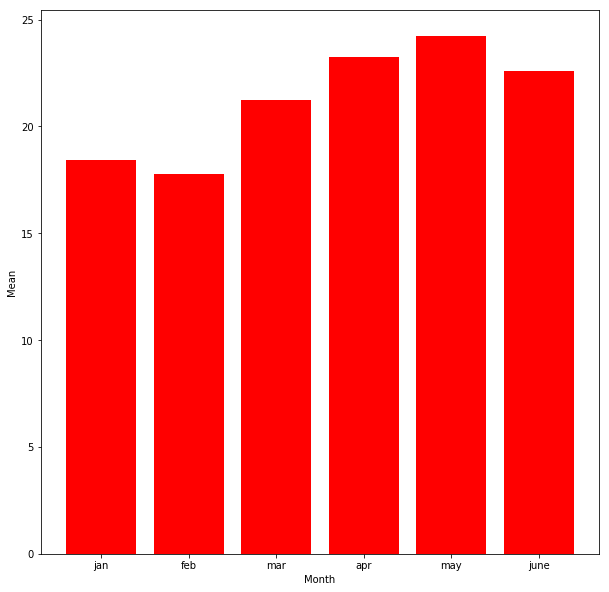

In [40]:
generaGraficoMese("EWR", "red")

From the Newark Airport we notice a bigger value of mean in May.

Finally we can conclude saying that among all boroughs May is the month with the biggest trip avarage, and in particular, Manhattan is the borough with the biggest affluence of taxis.

# RQ2

Our goal is to find the time slot with more passengers.

So, at first, we choose the time intervals we want to study: we have choosen slots of one hour.

To compute the analysis we need to concatenate all months dataframes in only one, considering just the columns we need (otherwise the process would occupy too much memory).

So, taken "tpep_pickup_datetime", "passenger_count", "PULocationID" columns, we can start!

In [22]:
#riesegui conversione formato datetime
months = [jan, feb, mar, apr, may, june]
for m in months:
    m["tpep_pickup_datetime"] = pandas.to_datetime(m["tpep_pickup_datetime"], yearfirst = True)
   

In [ ]:
#we want an unique df for all months
all_months = pandas.concat([jan[["tpep_pickup_datetime", "passenger_count", "PULocationID"]],feb[["tpep_pickup_datetime", "passenger_count", "PULocationID"]],
                            mar[["tpep_pickup_datetime", "passenger_count", "PULocationID"]],apr[["tpep_pickup_datetime", "passenger_count", "PULocationID"]],
                            may[["tpep_pickup_datetime", "passenger_count", "PULocationID"]],june[["tpep_pickup_datetime", "passenger_count", "PULocationID"]]])


In [ ]:
for i in months:
    del i
#deleting some variables to a free memory

In this case we need to consider just the hour, so we extract it from the "tpep_pickup_datetime" field.

Then we group our dataframe by hour, counting for each one the sum of passengers. 

After that, we create an array with all the totals of passengers.

In [13]:
#creating a new column from pickup datetimes, without dates, but just with times
all_months["hour"] = all_months["tpep_pickup_datetime"].dt.hour

In [16]:
#z is the df grouped by the values only_time.
#for each value of time, we count the total of passengers

z = all_months.groupby(["hour"]).sum()["passenger_count"].reset_index(name="tot_passenger")

In [21]:
tot = np.asarray(z.tot_passenger)

In [22]:
print(tot)

[2730318 1880015 1344609  984298  773560  817492 1856768 3158672 3936276
 3975121 3965001 4144384 4408124 4447362 4670808 4660734 4349956 4952012
 5561595 5373485 4866868 4935002 4675419 3806246]


Now, creating an array with all the time slots names and having the array with the totals of passengers, we can build our plot which shows fo every hour the number of costumers that asks for a taxi.

Text(0,0.5,'Total of passengers')

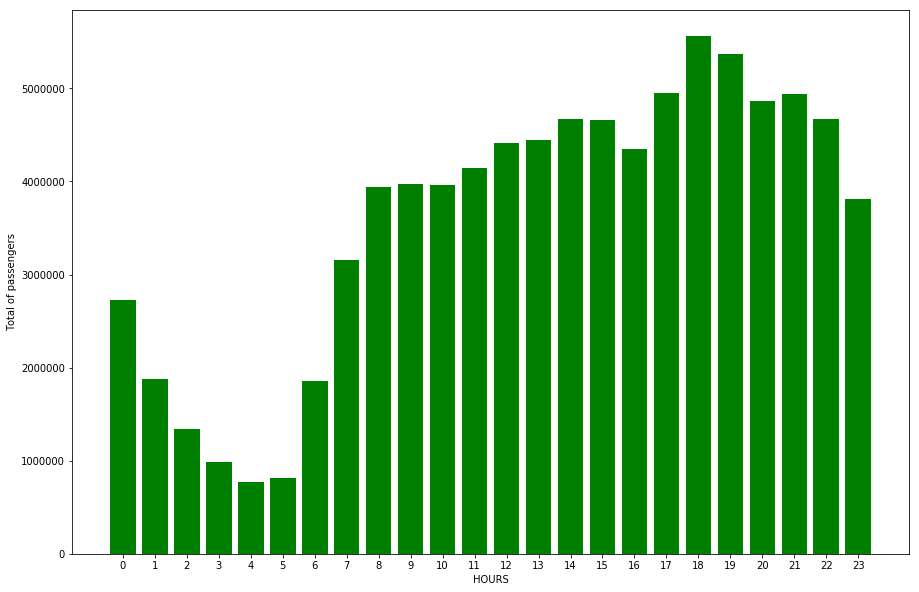

In [23]:
rcParams['figure.figsize'] = [15,10]
slots = ["0","1","2","3","4","5","6","7","8","9","10","11","12","13","14","15","16","17","18","19","20","21","22","23"]
coord_x = np.asarray(slots)
coord_y = np.asarray(tot)

graph = plt.bar(coord_x, coord_y, color = "green")
plt.xlabel("HOURS")
plt.ylabel("Total of passengers")


 We notice that the highest number of passengers driven overall New York is in the time slot between 6pm and 7pm.
 
 We can also observe that at 4 am there is the minimum amount of taxis costumers.
 
 How can we comment this result? 6 pm and 7 pm are rush hours, when people come back home from work or start going out for dinner. At 4 am there is a free hour, where the taxis question is really low: few people start going to work or return home after a long night at that hour. So there are less taxis trips.

### BOROUGH

Our second goal is to repeat the analysis for each borough.

So we build a function which prints a plot with the tot given, for each hour.

Then we apply this function to every borough, after computing the total of passengers.

In [56]:
def stampaGrafico(tot, color = "green"):
    rcParams['figure.figsize'] = [15,10]
    slots = ["0","1","2","3","4","5","6","7","8","9","10","11","12","13","14","15","16","17","18","19","20","21","22","23"]
    coord_x = np.asarray(slots)
    coord_y = np.asarray(tot)

    graph = plt.bar(coord_x, coord_y, color = color)
    plt.xlabel("HOURS")
    plt.ylabel("Total of passengers")

In [25]:
#FOR BOROUGH
b = all_months.groupby(["PULocationID","hour"]).sum()["passenger_count"].reset_index(name="tot_passenger")


To compute this analysis we need to join the original dataframe "all_months" with the "taxi_zone" dataframe (consdering just the "LocationID"and "Borough" columns of it, for a reason of memory).

In [27]:
#I consider only the columns I need
bor_tab = taxi_zone[["LocationID", "Borough"]]

In [28]:
union = b.set_index('PULocationID').join(bor_tab.set_index('LocationID'))

So, as you can see, for each borough we have to compute the total of passengers for every time slot. Then We apply the above function with as input the total computed.

### Brooklyn

In [48]:
brook = union[union.Borough == "Brooklyn"].groupby(by = "hour").sum()["tot_passenger"].reset_index(name ="sum_passengers")


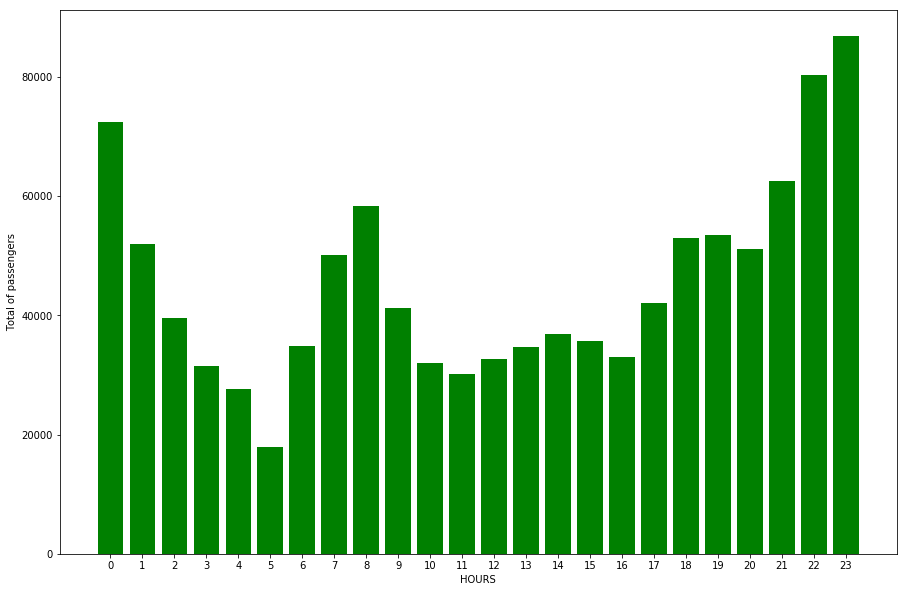

In [57]:
stampaGrafico(brook.sum_passengers)

In Brooklyn, at 11 pm there is the highest number of passengers driven by taxis.

So, it's a zone really frequented at night, maybe for happy hour after dinner or night clubs.

### Bronx

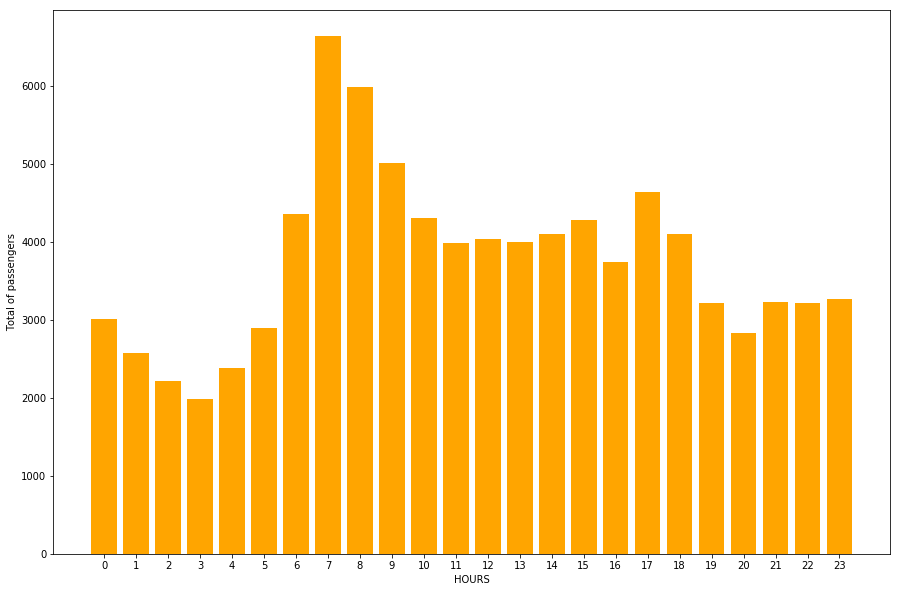

In [61]:
bronx = union[union.Borough == "Bronx"].groupby(by = "hour").sum()["tot_passenger"].reset_index(name ="sum_passengers")
stampaGrafico(bronx.sum_passengers, "orange")

In Bronx the highest number of passengers which takes taxi is at 7 am.

It can be possible that a big piece of population who lives here needs to move to other zones for work or for school, in the first morning.

### EWR

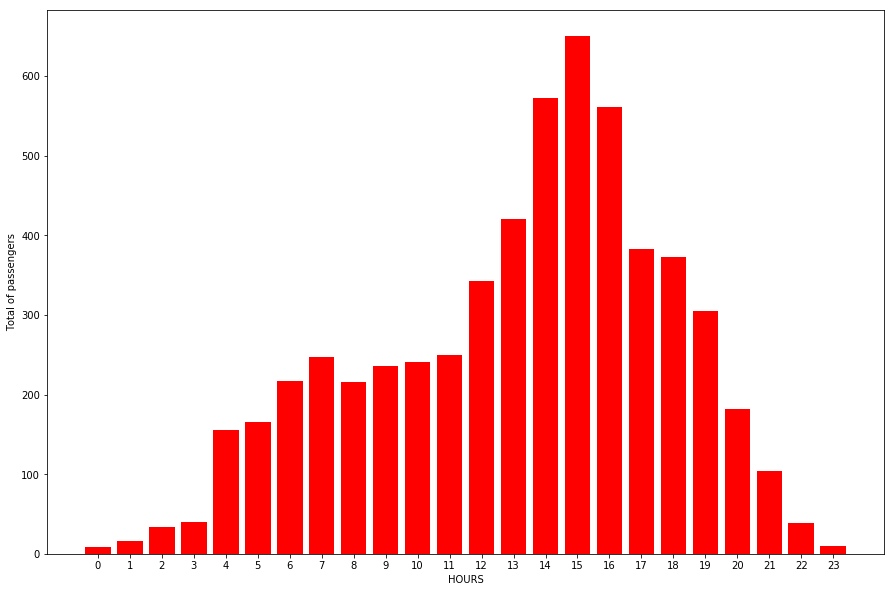

In [63]:
ewr = union[union.Borough == "EWR"].groupby(by = "hour").sum()["tot_passenger"].reset_index(name ="sum_passengers")
stampaGrafico(ewr.sum_passengers, "red")

At 3 pm there is the highest number of passengers who take taxi from the airport. So it seems that there are lots of arrivals in the first afternoon at the airport. This explains the necessity of passengers to take a taxi to go to the city.

### Unknown


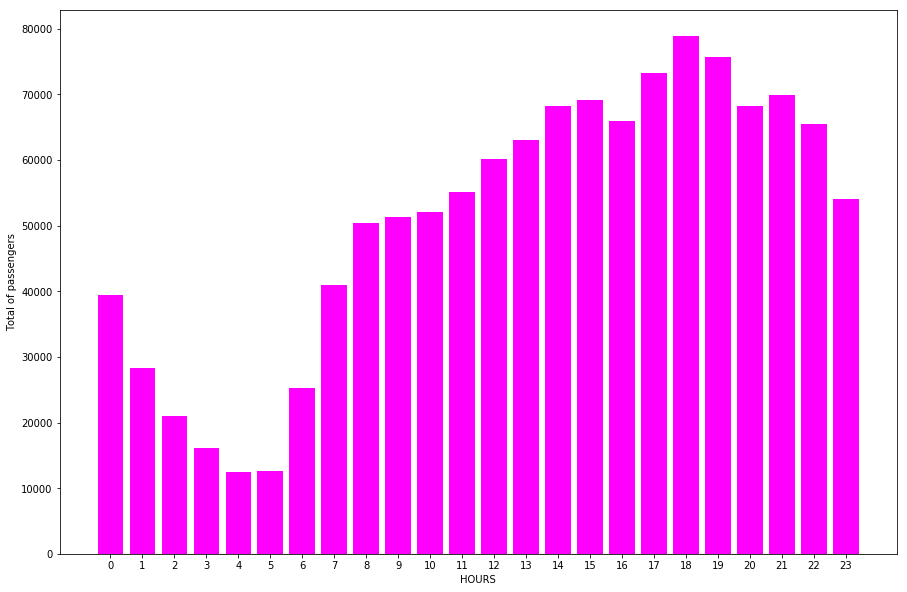

In [64]:
unknown = union[union.Borough == "Unknown"].groupby(by = "hour").sum()["tot_passenger"].reset_index(name ="sum_passengers")
stampaGrafico(unknown.sum_passengers, "magenta")

In corrispondence of unknown boroughs we have an higher number of passengers at 6 pm.

### Manhattan

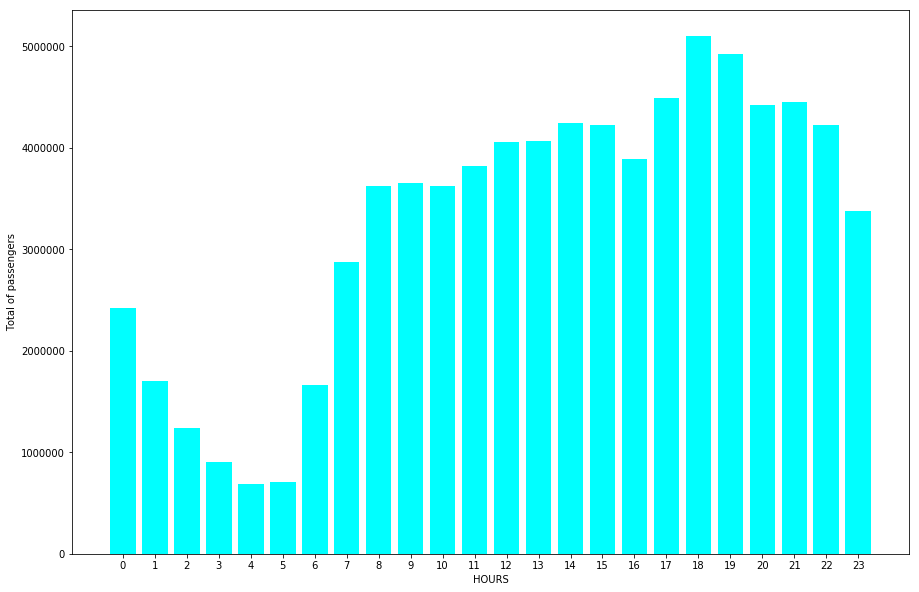

In [65]:
manhattan = union[union.Borough == "Manhattan"].groupby(by = "hour").sum()["tot_passenger"].reset_index(name ="sum_passengers")
stampaGrafico(manhattan.sum_passengers, "cyan")

About Manhattan, at 6 pm ther is the highest number of passengers driven by taxis. Maybe lots of people need to move to other zones for work or school reasons.

### Queens

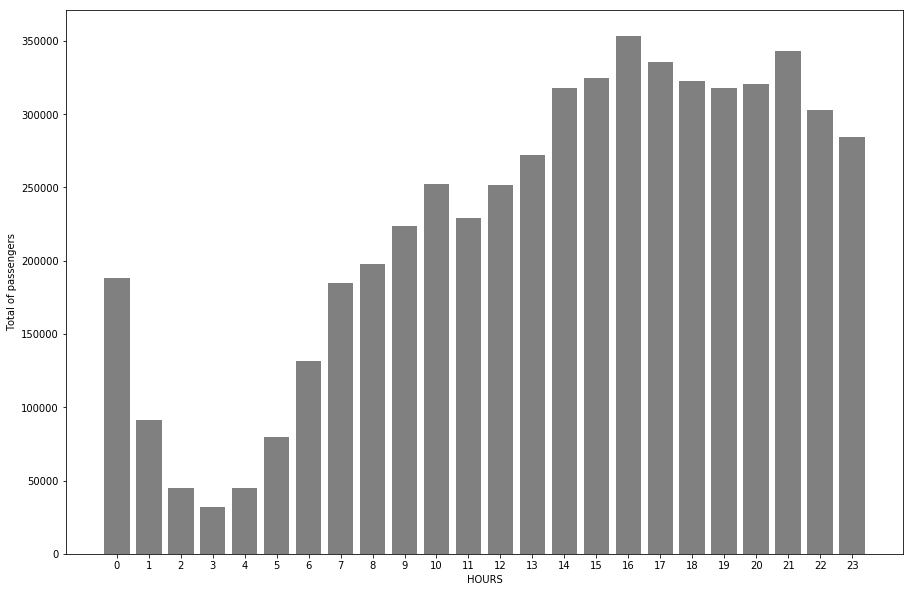

In [66]:
queens = union[union.Borough == "Queens"].groupby(by = "hour").sum()["tot_passenger"].reset_index(name ="sum_passengers")
stampaGrafico(queens.sum_passengers, "grey")

From Queens borough, at 4 pm there is the bigger number of people that takes taxi.

### Staten Island

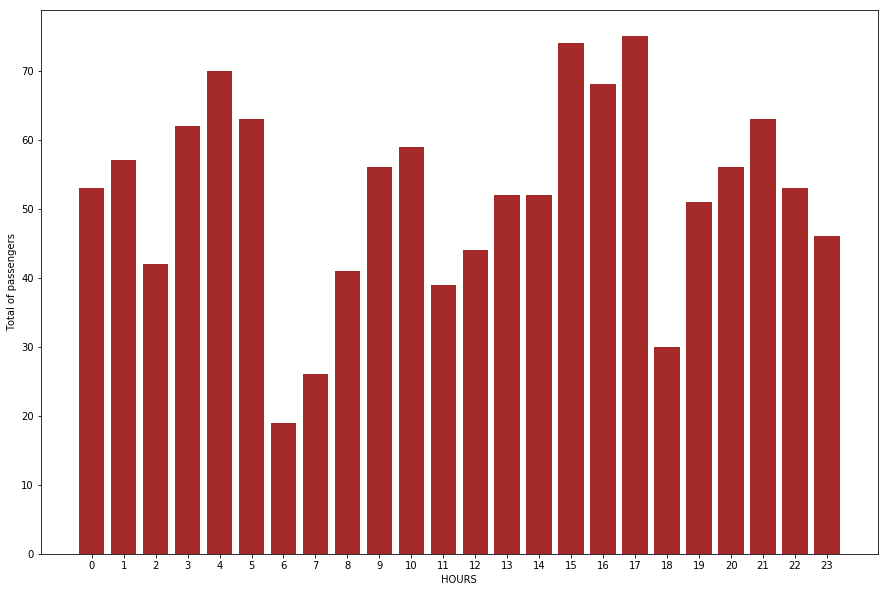

In [67]:
si = union[union.Borough == "Staten Island"].groupby(by = "hour").sum()["tot_passenger"].reset_index(name ="sum_passengers")
stampaGrafico(si.sum_passengers, "brown")

At 5 pm and at 3 pm, we notice a bigger affluence of taxi costumers in Staten Island.

In general, the frequency of passengers changes for every borough. We can see that more or less, in the evening there is a little bit more affluence.

Staten Island is the only borough that has high numbers of passengers in the very first morning (between 1 am and 5 am).

# RQ3

Our goal is to compute the duration of all the trips and comparing them.

So, we consider only one dataframe for all the months, just with columns we need.
Then we consider just the hour from the "tpep_pickup_datetime" and the "tpep_dropoff_datetime" fields, in particular approximating seconds to minutes (for easier calculations).

After computing the difference between drop-off and pick-up time, we obtain the durations for every trip.

Now we need to group the dataframe by the duration, computing for each value of it the number of rows dedicated (and so, the number of trips).

We observe that among the results, we obtain some durations of more than one day, so we just consider the dataframe with days equal to zero.

In [11]:
def duration_df():
    all_months = pandas.concat([jan[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],feb[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],
                            mar[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],apr[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],
                            may[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],june[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]]])
    #converting to datetime format
    all_months["tpep_pickup_datetime"] = pandas.to_datetime(all_months["tpep_pickup_datetime"])
    all_months["tpep_dropoff_datetime"] = pandas.to_datetime(all_months["tpep_dropoff_datetime"])
    #it deletes the seconds part approximating the minutes
    all_months["tpep_pickup_datetime"] = all_months.assign(tpep_pickup_datetime=all_months.tpep_pickup_datetime.dt.round('T'))["tpep_pickup_datetime"]
    all_months["tpep_dropoff_datetime"] = all_months.assign(tpep_dropoff_datetime=all_months.tpep_dropoff_datetime.dt.round('T'))["tpep_dropoff_datetime"]
    #computing the difference
    all_months["trip_duration"] = (all_months["tpep_dropoff_datetime"] - all_months["tpep_pickup_datetime"]).fillna(0)
    #grouping by duration
    same_dur = all_months.groupby(["trip_duration"]).size().reset_index(name ="tot")
    #Considering just the duration with day = 0. Infact there are some trips with of more of one day. 
    #It should be a table compilation mistake (they maybe insert wrong dates)
    same_dur = same_dur[same_dur.trip_duration.dt.days == 0]
    return same_dur

In [12]:
same_dur = duration_df()

In [13]:
#creating the y coord array
coord_y = np.asarray(same_dur.tot)

In [27]:

pandas.options.mode.chained_assignment = None
#converting duration in datetime format
same_dur["trip_duration"] = pandas.to_datetime(same_dur["trip_duration"])
#creating coord x, in time format
coord_x = same_dur.trip_duration.dt.strftime("%T").astype(str)
#converting it in array
coord_x = np.asarray(coord_x)

coord_x


array(['00:00:00', '00:01:00', '00:02:00', ..., '23:57:00', '23:58:00',
       '23:59:00'], dtype=object)

Text(0,0.5,'Number of trips with same duration')

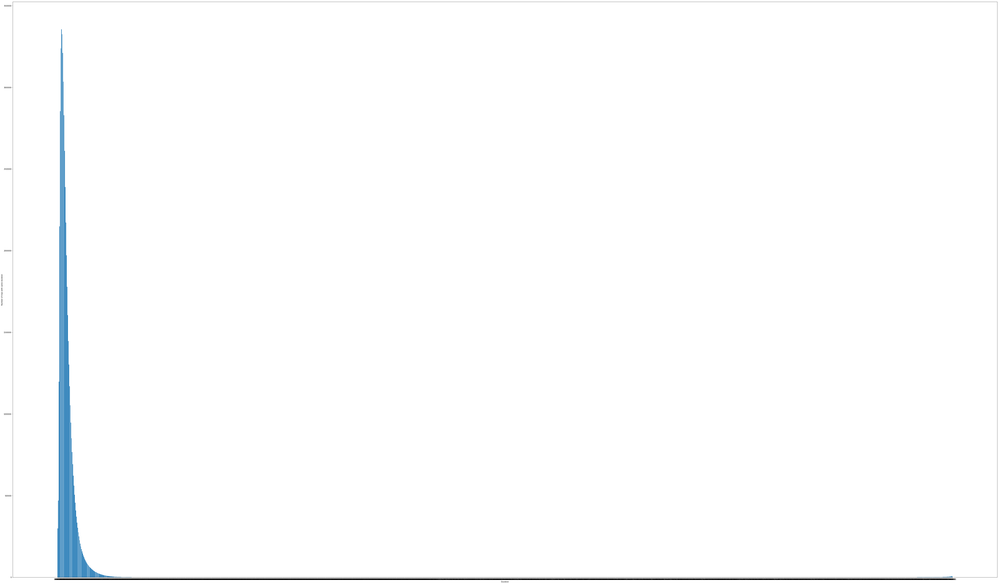

In [28]:
rcParams['figure.figsize'] = [100, 60]
plt.bar(coord_x, coord_y)
#plt.plot([1,2,3,4,5,6], l)
plt.xlabel("Duration")
plt.ylabel("Number of trips with same duration")

Representing the totals of trips for every value of duration on a plot, we obtain this. 

We can conclude that for short durations we have a bigger amount of trips.



### BOROUGH

Our second goal is to repeat the analysis for each borough. So after computing the duration as we did before, we join the dataframe which we obtain with the "taxi_zone" one (always considering just the columns we need).

In [11]:
def durata_df():
    all_months = pandas.concat([jan[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],feb[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],
                            mar[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],apr[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],
                            may[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]],june[["tpep_pickup_datetime", "tpep_dropoff_datetime", "PULocationID"]]])
    #converting to datetime format
    all_months["tpep_pickup_datetime"] = pandas.to_datetime(all_months["tpep_pickup_datetime"])
    all_months["tpep_dropoff_datetime"] = pandas.to_datetime(all_months["tpep_dropoff_datetime"])
    #it deletes the seconds part approximating the minutes
    all_months["tpep_pickup_datetime"] = all_months.assign(tpep_pickup_datetime=all_months.tpep_pickup_datetime.dt.round('T'))["tpep_pickup_datetime"]
    all_months["tpep_dropoff_datetime"] = all_months.assign(tpep_dropoff_datetime=all_months.tpep_dropoff_datetime.dt.round('T'))["tpep_dropoff_datetime"]
    #computing the difference
    all_months["trip_duration"] = (all_months["tpep_dropoff_datetime"] - all_months["tpep_pickup_datetime"]).fillna(0)
    #grouping by duration
    same_dur = all_months.groupby(["PULocationID","trip_duration"]).size().reset_index(name ="tot")
    #Considering just the duration with day = 0. Infact there are some trips with of more of one day. 
    #It should be a table compilation mistake (they maybe insert wrong dates)
    same_dur = same_dur[same_dur.trip_duration.dt.days == 0]
    return same_dur

In [12]:
dur = durata_df()

In [13]:
bor_tab = taxi_zone[["LocationID", "Borough"]]

In [14]:
union = dur.set_index('PULocationID').join(bor_tab.set_index('LocationID'))

Now, we group our new dataframe by borough and, in a second moment, by duration, computing for each of it the sum of the number of trips.

In [15]:
for_bor = union.groupby(["Borough","trip_duration"]).sum()["tot"].reset_index(name ="tot_borough")

Then we build a function to apply for every borough. 

In this function, we consider the part of dataframe dedicated to a particular borough given as input to the function, and we represent the results for every value of duration by a plot.

In [16]:
def borough_plot(borough):
    bor = for_bor[for_bor.Borough == borough]
    coord_y = np.asarray(bor.tot_borough)
    pandas.options.mode.chained_assignment = None
    #converting duration in datetime format
    bor["trip_duration"] = pandas.to_datetime(bor["trip_duration"])
    #creating coord x, in time format
    coord_x = bor.trip_duration.dt.strftime("%T").astype(str)
    #converting it in array
    coord_x = np.asarray(coord_x)
    rcParams['figure.figsize'] = [100, 60]
    plot = plt.bar(coord_x, coord_y)
    #plt.plot([1,2,3,4,5,6], l)
    plt.xlabel("Duration")
    plt.ylabel("Number of trips with same duration")
    return plot

### Bronx

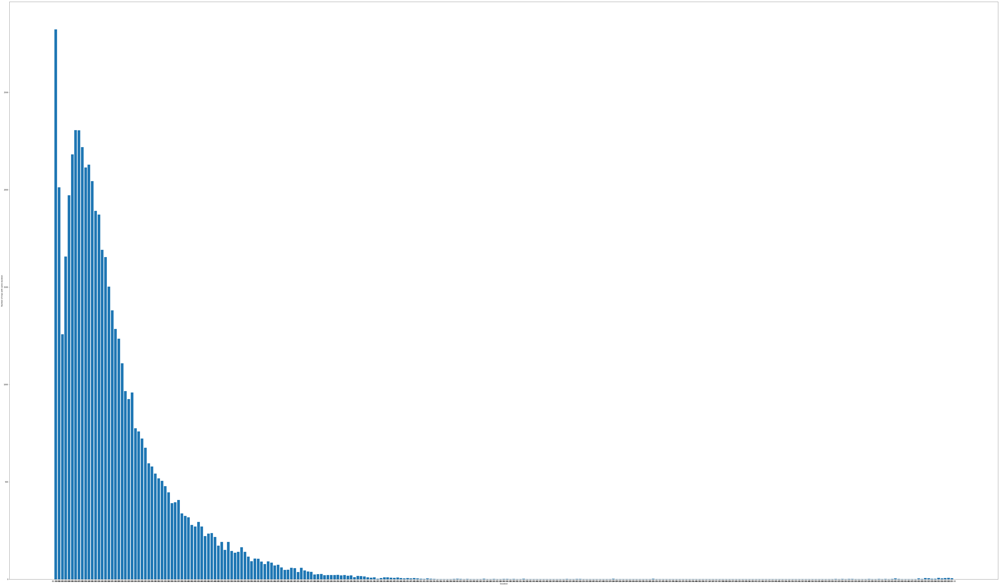

In [17]:
bronx = borough_plot("Bronx")

### Brooklyn

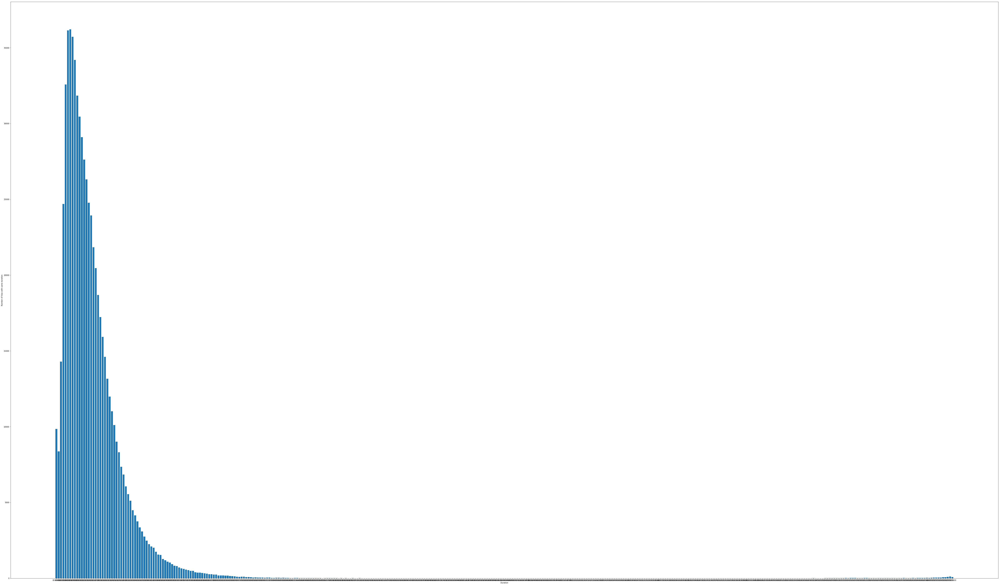

In [18]:
brook = borough_plot("Brooklyn")

### Manhattan

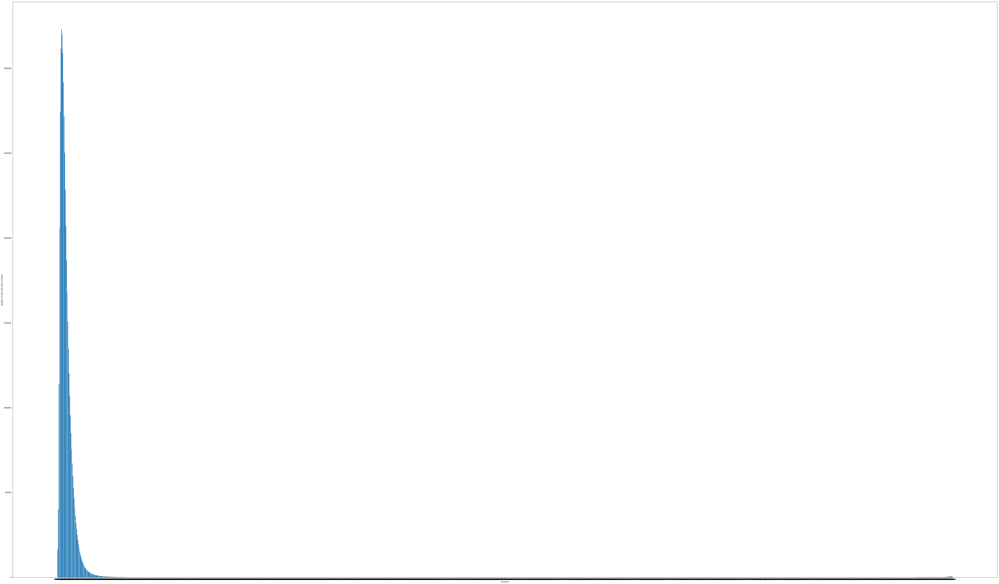

In [19]:
man = borough_plot("Manhattan")

### Queens

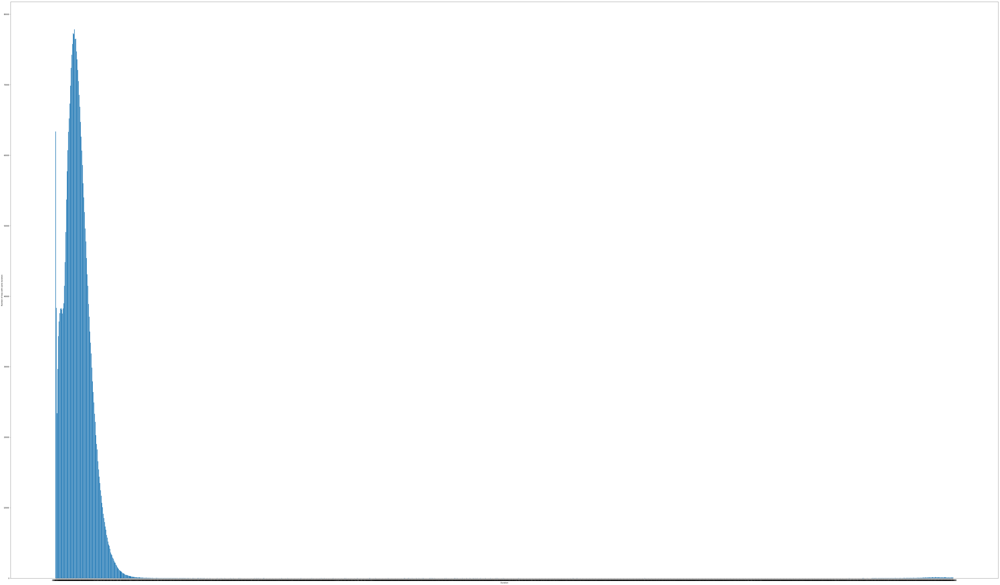

In [20]:
queens = borough_plot("Queens")

### Staten Island

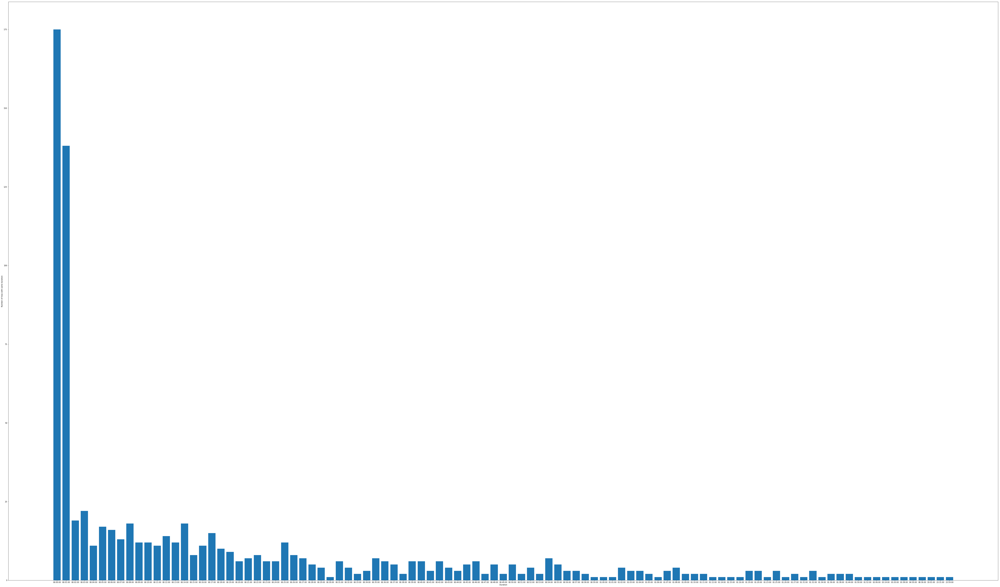

In [21]:
si = borough_plot("Staten Island")

### Unknown

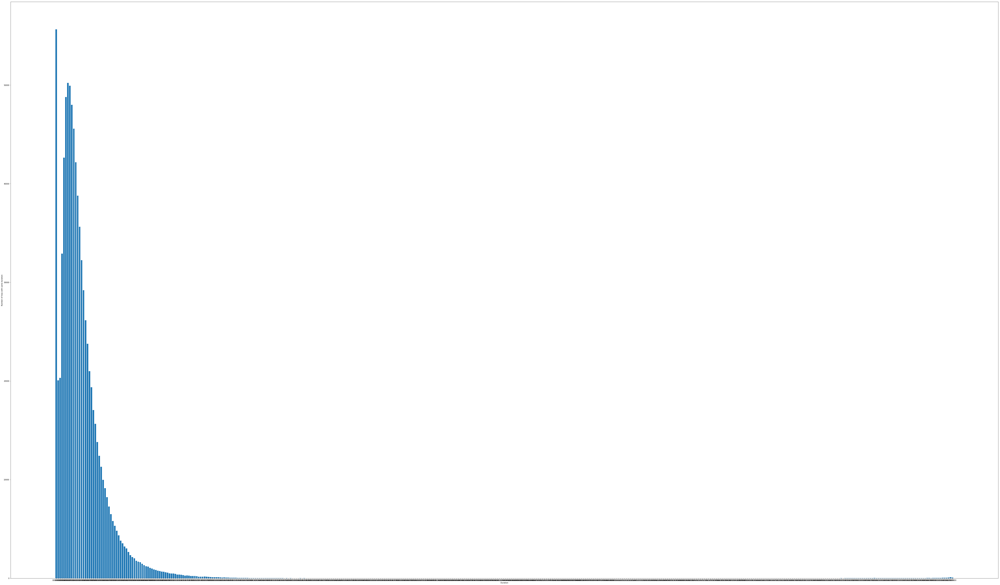

In [22]:
un = borough_plot("Unknown")

### EWR

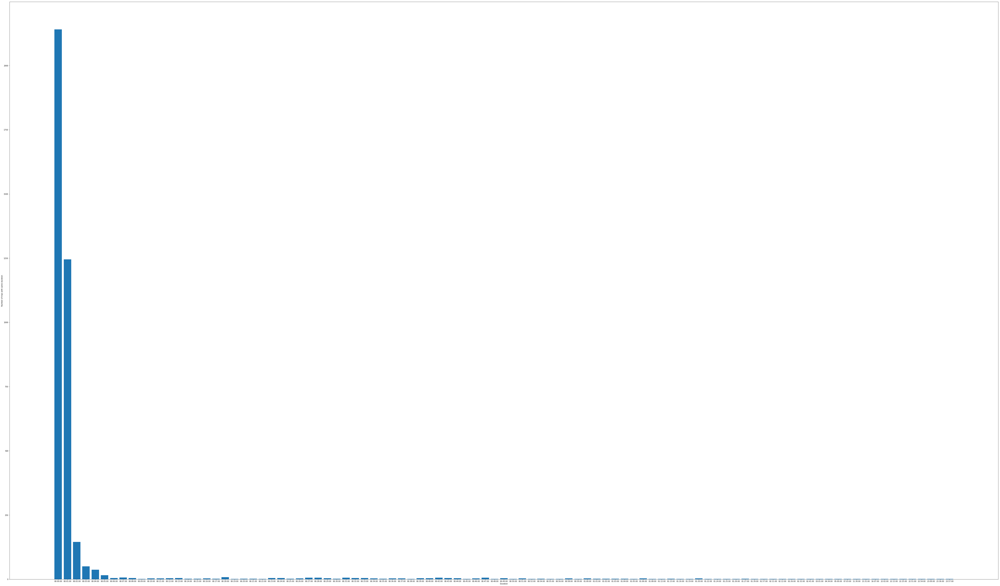

In [23]:
ewr = borough_plot("EWR")

In all the cases, we see that for short durations, we have a large number of trips.

# RQ4

Our goal is to find for every borough the payment methods adopted.

At first we need the concatenation of each month dataframe, considering just PULocationID and payment_type columns.
Then we have to join this dataframe with the taxi zone one, obtaining also the borough column.

Then for every borough, we just consider the interested part of dataframe, grouping it by payment_type, so to get for every means, the number of payments.

In [11]:
#it creates a big df with all the month df inside, considering just the columns we need
all_months = pandas.concat([jan[["payment_type","PULocationID"]],feb[["payment_type", "PULocationID"]],
                            mar[["payment_type","PULocationID"]],apr[["payment_type", "PULocationID"]],
                            may[["payment_type", "PULocationID"]],june[["payment_type", "PULocationID"]]])


In [12]:
#it considers the only two columns we desire of taxi_zone
boroughs = taxi_zone[["LocationID", "Borough"]]

In [14]:
#join the 2 dfs
union = all_months.set_index('PULocationID').join(boroughs.set_index('LocationID'))

In [22]:
#this fun return for every method, the number of payments done
#we'll apply it for every borough
def bor_analysis(borough):
    b = union[union.Borough == borough].groupby(by = "payment_type").size().reset_index(name ="tot")
    return b

As we can see from the following results, methods 5 and 6 don't appear in any borough. So there aren't unknown payment methods or voided trips.

Everywhere the <b> credit card</b> is the most choosen respect to other payment methods.
Then the cash way follows. 

The methods 3 and 4 are used less: this means that there are few trips at no cost or with disputes.

### Bronx

In [29]:
bronx = bor_analysis("Bronx")

In [30]:
bronx

,payment_type,tot
0,1,27788
1,2,26147
2,3,1515
3,4,360


### Brooklyn

In [31]:
brook = bor_analysis("Brooklyn")

In [32]:
brook

,payment_type,tot
0,1,441890
1,2,230533
2,3,8789
3,4,1923


### Manhattan

In [33]:
man = bor_analysis("Manhattan")

In [34]:
man

,payment_type,tot
0,1,34188788
1,2,14480638
2,3,226799
3,4,63615


### Queens

In [35]:
queens = bor_analysis("Queens")

In [36]:
queens

,payment_type,tot
0,1,2311245
1,2,1000704
2,3,37296
3,4,8937


### Staten Island

In [37]:
si = bor_analysis("Staten Island")

In [38]:
si

,payment_type,tot
0,1,434
1,2,318
2,3,50
3,4,13


### Unknown

In [39]:
un = bor_analysis("Unknown")

In [40]:
un

,payment_type,tot
0,1,595317
1,2,255817
2,3,10652
3,4,2313


### EWR

In [41]:
ewr = bor_analysis("EWR")

In [42]:
ewr

,payment_type,tot
0,1,3036
1,2,551
2,3,220
3,4,47


### Chi-Squared Test

The chi-squared test is used to determine whether there is a significant difference between the expected frequencies and the observed frequencies in one or more categories.

We are using the scipy.stat function called "chisqaure" to compute the test over each borough.

It takes as input an array with the observed frequencies (in our case, the number of payment for every method, considered for every borough) and an array with the expected frequencies, in each categories.

The last array values are computed by this easy formula:

$$ Expected Value = \frac{row Total * column Total}{grand Total} $$

Where "row Total" and "column Total" are the sum of values for each row and column of the table.
The grand Total is the sum of all rows and columns of the dataframe.

What we obtain as output from the  scipy.stat function "chisquare" is the chi-squared test <b>statistic</b> and the <b>p-value</b> of the test.

The first one is an overall measure of how close the observed frequencies are to the expected frequencies. The null hypothesis <b>H0</b> of independence is rejected if  $\chi^2$ is large, because this means that observed frequencies and expected frequencies are far apart. 

The p-value is the probability of getting a large chi-squared when the two variables are independent as the null hypothesis <b>H0</b> says.

Based on the values assumed by p-value, we have the following results:
* for <i>p-value</i> > 0.1, there is no evidence against the null hypothesis (independence);
* for 0.05 < <i>p-value</i> < 0.1, there is a very weak evidence of dependence between the frequencies;
* for 0.01 < <i>p-value</i> < 0.05, there is a moderately strong evidence of dependence between frequencies;
* for <i>p-value</i> < 0.01, there is a strong evidence of dependence between frequencies, so the null hypothesis is rejected .

So, to compute our Chi Test Square over all the boroughs, we need to concatenate the previous dataframes of each borough, just considering the total amounts for each method of payments. 

Then we compute the <b>row_total</b>, the <b>column_total</b> and the <b>grand_total</b> we talked about before, to our new dataframe obtained.

Finally we can compute the <b>expected value</b> for every method of payment, creating an array with the results.

Now, we can apply the chisquare function giving to it as input two arrays: the first with the observed values for each borough (our datas) and the second with the expected values computed.

In [81]:
chi = pandas.concat([bronx.drop(['payment_type'], axis=1).rename(columns={"tot": "tot_bronx"}), brook.drop(['payment_type'], axis=1).rename(columns={"tot": "tot_brook"}),man.drop(['payment_type'], axis=1).rename(columns={"tot": "tot_man"}), queens.drop(['payment_type'], axis=1).rename(columns={"tot": "tot_queens"}), si.drop(['payment_type'], axis=1).rename(columns={"tot": "tot_si"}), un.drop(['payment_type'], axis=1).rename(columns={"tot": "tot_un"}), ewr.drop(['payment_type'], axis=1).rename(columns={"tot": "tot_ewr"})], axis=1, sort=False)


In [83]:
#making the sum of rows values
chi['Tot_row'] = chi.sum(axis = 1)

In [109]:
#making the sum of columns values
gh = chi.sum(axis = 0)
gh = pandas.DataFrame(gh)
gh = gh.transpose()

In [116]:
#concatenating the row of the sum columns to the chi df
conc = pandas.concat([chi, gh], axis= 0, ignore_index=True)
conc.rename({4: "Tot_col"}, axis='index')

,tot_bronx,tot_brook,tot_man,tot_queens,tot_si,tot_un,tot_ewr,Tot_row
0,27788,441890,34188788,2311245,434,595317,3036,37568498
1,26147,230533,14480638,1000704,318,255817,551,15994708
2,1515,8789,226799,37296,50,10652,220,285321
3,360,1923,63615,8937,13,2313,47,77208
Tot_col,55810,683135,48959840,3358182,815,864099,3854,53925735


In [172]:
def chi_test(b_col):
    b_values = np.asarray(b_col[0:4])
    exp_freq = []
    for i in range(4):
        EF = (b_col[4] * conc.Tot_row[i]) / conc.Tot_row[4]
        exp_freq.append(EF)
    
    return scipy.stats.chisquare(b_values, f_exp = exp_freq)

#### Bronx

In [173]:
chi_test(conc.tot_bronx)

Power_divergenceResult(statistic=14744.607186683905, pvalue=0.0)

#### Brooklyn

In [174]:
chi_test(conc.tot_brook)

Power_divergenceResult(statistic=14598.857225021284, pvalue=0.0)

#### Manhattan

In [175]:
chi_test(conc.tot_man)

Power_divergenceResult(statistic=4917.656102570703, pvalue=0.0)

#### Queens

In [176]:
chi_test(conc.tot_queens)

Power_divergenceResult(statistic=25371.673802991714, pvalue=0.0)

#### Unknown

In [177]:
chi_test(conc.tot_un)

Power_divergenceResult(statistic=9096.082564490951, pvalue=0.0)

#### Staten Island

In [178]:
chi_test(conc.tot_si)

Power_divergenceResult(statistic=659.6513672274923, pvalue=1.1770090189058367e-142)

#### EWR

In [179]:
chi_test(conc.tot_ewr)

Power_divergenceResult(statistic=2618.379295122337, pvalue=0.0)

Our p-values are always equals to zero (minus Staten Island's one, that is however less than 0.01). 

So from our results we can say that there is a strong dependence between boroughs and method of payment.


# RQ5

Our goal is to find the dependence between distance and duration of trips. 

To do this, we need to access to these values, for every month. 

So we take the concatenation of all the month dataframes, considering just the trip_distance, pickup_datetime and dropoff_datetime columns. Computing the difference bewteen the last two values, we obtain the trip duration.

So, creating two arrays with duration and distance values, we can make a plot to show their correlation.

In [11]:
def durata_dist():
    all_months = pandas.concat([jan[["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"]],feb[["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"]],
                            mar[["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"]],apr[["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"]],
                            may[["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"]],june[["tpep_pickup_datetime", "tpep_dropoff_datetime", "trip_distance"]]])
    #converting to datetime format
    all_months["tpep_pickup_datetime"] = pandas.to_datetime(all_months["tpep_pickup_datetime"])
    all_months["tpep_dropoff_datetime"] = pandas.to_datetime(all_months["tpep_dropoff_datetime"])
    #it deletes the seconds part approximating the minutes
    all_months["tpep_pickup_datetime"] = all_months.assign(tpep_pickup_datetime=all_months.tpep_pickup_datetime.dt.round('T'))["tpep_pickup_datetime"]
    all_months["tpep_dropoff_datetime"] = all_months.assign(tpep_dropoff_datetime=all_months.tpep_dropoff_datetime.dt.round('T'))["tpep_dropoff_datetime"]
    #computing the difference
    all_months["trip_duration"] = (all_months["tpep_dropoff_datetime"] - all_months["tpep_pickup_datetime"]).fillna(0)
    
    #Considering just the duration with day = 0. Infact there are some trips with of more of one day. 
    #It should be a table compilation mistake (they maybe insert wrong dates)
    result = all_months[all_months.trip_duration.dt.days == 0]
    return result[["trip_distance", "trip_duration"]]

In [18]:
df = durata_dist()

In [45]:
df["trip_duration"] = df["trip_duration"].astype(int)

In [47]:
df.dtypes

trip_distance    float64
trip_duration      int64
dtype: object

In [48]:
#same_dur_dist = df.groupby(["trip_distance", "trip_duration"]).size()

In [49]:
#no considering the zero distance (they haven't sense)
no_zero = df[df.trip_distance != 0]

In [50]:
no_zero = no_zero.sort_values(["trip_distance"])

In [51]:
y = np.asarray(no_zero[["trip_duration"]])

In [52]:
x = np.asarray(no_zero[["trip_distance"]])

Text(0,0.5,'Distance')

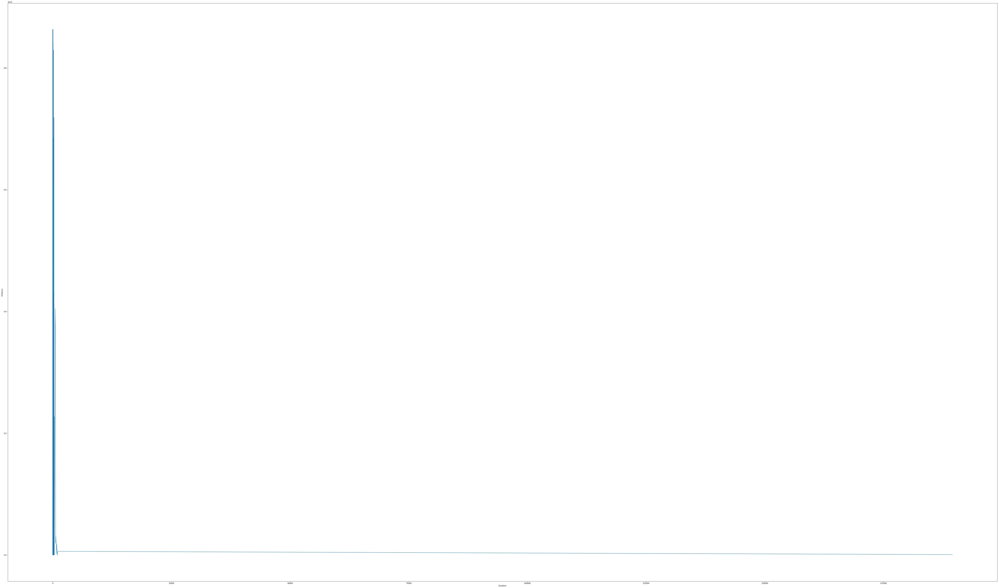

In [43]:
mpl.rcParams['agg.path.chunksize'] = 10000
rcParams['figure.figsize'] = [100, 60]
plot = plt.plot(x, y)
#plt.plot([1,2,3,4,5,6], l)
plt.xlabel("Duration")
plt.ylabel("Distance")

As we can see, there is a not linear correlation between distance and duration, but however there is a dependence.

We can describe it computing the Pearson Coefficient: infact if it's different by zero, it seems that there is a correlation between the two parts.

### Pearson Coefficient

Pearson’s correlation requires that each dataset be normally distributed. 

The coefficient assumes values between -1 and +1 with 0 implying no correlation. 

Correlations of -1 or +1 imply an exact linear relationship.

Positive correlations imply that as x increases, so does y. Negative ones imply that as x increases, y decreases.

To compute the Pearson Coefficient, we use the scipy.stats function "pearsonr", putting as inputs, the arrays of distance and the duration.

In [54]:
pearson_coeff = scipy.stats.pearsonr(x,y)

In [55]:
pearson_coeff

(array([0.02268896]), array([0.]))

In our case, the Pearson Coefficient is about <i>0.02</i>. 

This implies that there is a positive correlation between distance and duration, but it's not linear: infact our value is really near to zero.

# CRQ1

Our goal is to discover if the fare for mile changes among the boroughs.

So we consider our dataframe with all the months datas, taking just the columns we need for the analysis.

In the next step, we'll need values of distance different by zero, so we're considering the dataframe with just these kind of values.

In [15]:
all_months = pandas.concat([jan[["PULocationID", "trip_distance", "fare_amount","tpep_pickup_datetime", "tpep_dropoff_datetime"]],feb[["PULocationID","trip_distance", "fare_amount","tpep_pickup_datetime", "tpep_dropoff_datetime"]],
                            mar[["PULocationID","trip_distance", "fare_amount","tpep_pickup_datetime", "tpep_dropoff_datetime"]],apr[["PULocationID","trip_distance", "fare_amount","tpep_pickup_datetime", "tpep_dropoff_datetime"]],
                            may[["PULocationID","trip_distance", "fare_amount","tpep_pickup_datetime", "tpep_dropoff_datetime"]],june[["PULocationID","trip_distance", "fare_amount","tpep_pickup_datetime", "tpep_dropoff_datetime"]]])
  

In [16]:
all_months = all_months[all_months.trip_distance != 0]

## P

At first we compute P and we join our original dataframe with the taxi_zone one.
Then for each borough, we take just the corresponding part of the dataframe, computing mean and standard deviation for the values of P column.

In [17]:
all_months["P"] = all_months["fare_amount"] / all_months["trip_distance"]

In [18]:
zone = taxi_zone[["LocationID", "Borough"]]

In [19]:
union = all_months.set_index('PULocationID').join(zone.set_index('LocationID'))

### Bronx

In [20]:
bronx = union[union.Borough == "Bronx"]
P_arr_bronx = np.asarray(bronx[["P"]])
SD_bronx = np.std(P_arr_bronx)
mean_bronx = np.mean(P_arr_bronx)

In [21]:
SD_bronx

109.93666181555768

In [22]:
mean_bronx

8.760295287342277

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,'Bronx P distribution')

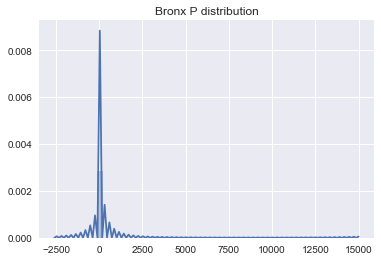

In [23]:
sns.distplot(P_arr_bronx).set_title("Bronx P distribution")


### Brooklyn

In [24]:
brook = union[union.Borough == "Brooklyn"]
P_arr_brook = np.asarray(brook[["P"]])
SD_brook = np.std(P_arr_brook)
mean_brook = np.mean(P_arr_brook)

In [25]:
SD_brook

58.39857548067293

In [26]:
mean_brook

6.157006399346344

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,'Brooklyn P distribution')

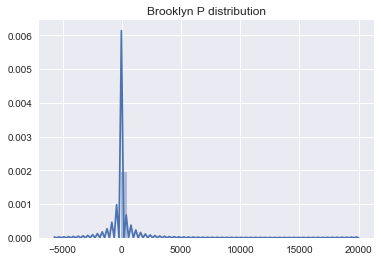

In [27]:
sns.distplot(P_arr_brook).set_title("Brooklyn P distribution")


### Manhattan

In [28]:
man = union[union.Borough == "Manhattan"]
P_arr_man = np.asarray(man[["P"]])
SD_man = np.std(P_arr_man)
mean_man = np.mean(P_arr_man)

In [29]:
SD_man

61.685920970579

In [30]:
mean_man

6.758895387863601

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,'Manhattan P distribution')

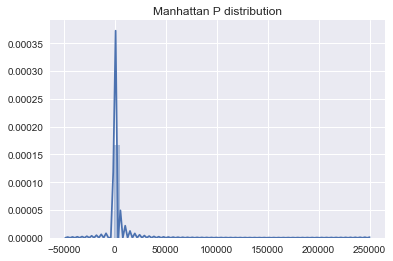

In [32]:
sns.distplot(P_arr_man).set_title("Manhattan P distribution")


### Queens

In [33]:
queens = union[union.Borough == "Queens"]
P_arr_queens = np.asarray(queens[["P"]])
SD_queens = np.std(P_arr_queens)
mean_queens = np.mean(P_arr_queens)

In [34]:
SD_queens

108.8185320295736

In [35]:
mean_queens

6.716584615772777

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,'Queens P distribution')

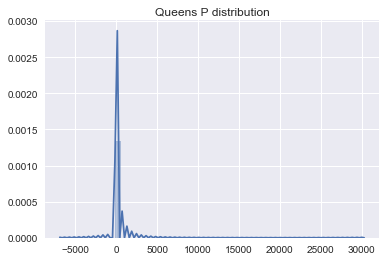

In [36]:
sns.distplot(P_arr_queens).set_title("Queens P distribution")


### Staten Island

In [37]:
si = union[union.Borough == "Staten Island"]
P_arr_si = np.asarray(si[["P"]])
SD_si = np.std(P_arr_si)
mean_si = np.mean(P_arr_si)

In [38]:
SD_si

127.02198588221268

In [39]:
mean_si

22.068148830435057

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,'Staten Island P distribution')

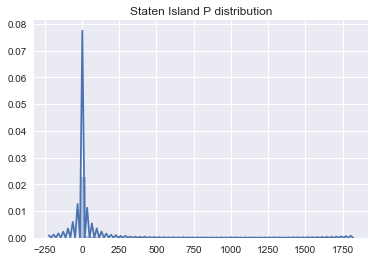

In [40]:
sns.distplot(P_arr_si).set_title("Staten Island P distribution")


### Unknown

In [41]:
un = union[union.Borough == "Unknown"]
P_arr_un = np.asarray(un[["P"]])
SD_un = np.std(P_arr_un)
mean_un = np.mean(P_arr_un)

In [42]:
SD_un

313.2328839790594

In [43]:
mean_un

22.816259006549178

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,'Unknown P distribution')

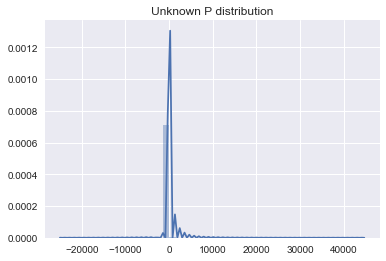

In [44]:
sns.distplot(P_arr_un).set_title("Unknown P distribution")


### EWR

In [45]:
ewr = union[union.Borough == "EWR"]
P_arr_ewr = np.asarray(ewr[["P"]])
SD_ewr = np.std(P_arr_ewr)
mean_ewr = np.mean(P_arr_ewr)

In [46]:
SD_ewr

2275.717392871308

In [47]:
mean_ewr

841.2749698276576

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,'EWR P distribution')

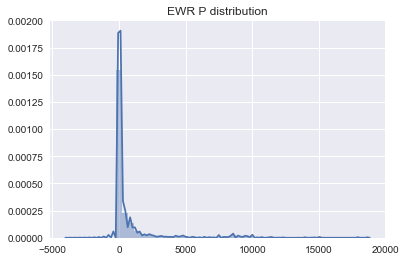

In [48]:
sns.distplot(P_arr_ewr).set_title("EWR P distribution")

### T - Test

A t-test is helpful to describe the difference between the means of two datasets. 

The outputs of t-test are the <b>t-value</b> and the <b>p-value</b>.

Higher values of the t-value, also called <i>t-score</i>, indicate that exists a large difference between the two sample sets. A smaller value of t-score shows a similarity between the two sample sets. So:

* A large t-score indicates that the groups are different;
* A small t-score indicates that the groups are similar.

The p-value is the probability of getting a large t-score when the two sample are different as the null hypothesis <b>H0</b> says.

Based on the values assumed by p-value, we have the following results:
* for <i>p-value</i> > 0.1, there is no evidence against the null hypothesis (samples are different);
* for 0.05 < <i>p-value</i> < 0.1, there is a very weak evidence of similarity between the samples;
* for 0.01 < <i>p-value</i> < 0.05, there is a moderately strong evidence of similarity between samples;
* for <i>p-value</i> < 0.01, there is a strong evidence of similarity between samples, so the null hypothesis is rejected .

To compute the t-test we use the scipy.stats function called "ttest_ind", that takes as inputs two arrays which are the two samples we talk about above.

So, we apply the function to the values of P for each couple of boroughs. In this cases we repeat a same couple (for example Bronx-Brooklyn and Brooklyn-Bronx) just one time. 
Actually the results can be a little different cause of the not equal sizes of the P-arrays, but in general the conclusions are always the same.

#### EWR, Staten Island


In [41]:
scipy.stats.ttest_ind(P_arr_ewr,P_arr_si)

Ttest_indResult(statistic=array([9.05846263]), pvalue=array([3.34763358e-19]))

#### EWR, Bronx

In [42]:
scipy.stats.ttest_ind(P_arr_ewr,P_arr_bronx)

Ttest_indResult(statistic=array([79.42384892]), pvalue=array([0.]))

#### EWR, Brooklyn

In [115]:
scipy.stats.ttest_ind(P_arr_ewr,P_arr_brook)

Ttest_indResult(statistic=array([256.15947075]), pvalue=array([0.]))

#### EWR, Manhattan

In [116]:
scipy.stats.ttest_ind(P_arr_ewr,P_arr_man)

Ttest_indResult(statistic=array([455.37073875]), pvalue=array([0.]))

#### EWR, Queens

In [117]:
scipy.stats.ttest_ind(P_arr_ewr,P_arr_queens)

Ttest_indResult(statistic=array([243.9874751]), pvalue=array([0.]))

#### EWR, Unknown

In [118]:
scipy.stats.ttest_ind(P_arr_ewr,P_arr_un)

Ttest_indResult(statistic=array([86.12412013]), pvalue=array([0.]))

#### Bronx, Brooklyn

In [119]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_brook)

Ttest_indResult(statistic=array([9.0064404]), pvalue=array([2.13349441e-19]))

#### Bronx, Manhattan

In [120]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_man)

Ttest_indResult(statistic=array([7.38822633]), pvalue=array([1.48802659e-13]))

#### Bronx, Queens

In [121]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_queens)

Ttest_indResult(statistic=array([4.24967674]), pvalue=array([2.14085048e-05]))

#### Bronx,  Staten Island

In [122]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_si)

Ttest_indResult(statistic=array([-3.02576144]), pvalue=array([0.00248128]))

#### Bronx, Unknown

In [134]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_un)

Ttest_indResult(statistic=array([-10.19512449]), pvalue=array([2.09149762e-24]))

#### Brooklyn, Manhattan

In [123]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_man)

Ttest_indResult(statistic=array([-7.94612504]), pvalue=array([1.92440181e-15]))

#### Brooklyn, Queens

In [124]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_queens)

Ttest_indResult(statistic=array([-4.09456545]), pvalue=array([4.22969322e-05]))

#### Brooklyn, Staten Island

In [125]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_si)

Ttest_indResult(statistic=array([-6.85039877]), pvalue=array([7.37073176e-12]))

#### Brooklyn, Unknown

In [126]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_un)

Ttest_indResult(statistic=array([-42.9587618]), pvalue=array([0.]))

#### Manhattan, Queens

In [128]:
scipy.stats.ttest_ind(P_arr_man,P_arr_queens)

Ttest_indResult(statistic=array([1.12965088]), pvalue=array([0.25862337]))

#### Manhattan, Staten Island

In [127]:
scipy.stats.ttest_ind(P_arr_man,P_arr_si)

Ttest_indResult(statistic=array([-6.25378326]), pvalue=array([4.00630201e-10]))

#### Manhattan, Unknown

In [129]:
scipy.stats.ttest_ind(P_arr_man,P_arr_un)

Ttest_indResult(statistic=array([-195.40484473]), pvalue=array([0.]))

#### Queens, Staten Island

In [130]:
scipy.stats.ttest_ind(P_arr_queens,P_arr_si)

Ttest_indResult(statistic=array([-3.55450582]), pvalue=array([0.0003787]))

#### Queens, Unknown

In [131]:
scipy.stats.ttest_ind(P_arr_queens,P_arr_un)

Ttest_indResult(statistic=array([-195.40484473]), pvalue=array([0.]))

In conclusion, we can notice that more or less all the p-values are really near or equal to zero. It means there is a very strong evidence of similarity among boroughs of each couple. 

The only couple that has got an high p-value is the one which consists in Manhattan and Queens: so the two boroughs are different in terms of mean of P, as the t-test confirms. 

In other words, a borough of this couple (from the values of the arrays it'easy to discover that it's Manhattan) is <b>on avarage</b> more expensive than the other (Queens).

## P'

To compute P' we need to know the trips duration.

So we make the difference between drop-off time and pick-up time, always consdiering just durations of one day (infact there are also other kind of durations, that last more of one day and that may be anomalous, so we are not considering them).

Another, we are not considering durations equal to zero, because they give us problems to compute P' (we can't have null values at the denominator.

Finally, we join our updated dataframe with the taxi_zone dataframe, computing for each borough mean and standard deviation of P'.

In [49]:
#converting to datetime format
all_months["tpep_pickup_datetime"] = pandas.to_datetime(all_months["tpep_pickup_datetime"])
all_months["tpep_dropoff_datetime"] = pandas.to_datetime(all_months["tpep_dropoff_datetime"])
#it deletes the seconds part approximating the minutes
all_months["tpep_pickup_datetime"] = all_months.assign(tpep_pickup_datetime=all_months.tpep_pickup_datetime.dt.round('T'))["tpep_pickup_datetime"]
all_months["tpep_dropoff_datetime"] = all_months.assign(tpep_dropoff_datetime=all_months.tpep_dropoff_datetime.dt.round('T'))["tpep_dropoff_datetime"]
#computing the difference
all_months["trip_duration"] = (all_months["tpep_dropoff_datetime"] - all_months["tpep_pickup_datetime"]).fillna(0)

#Considering just the duration with day = 0. Infact there are some trips with of more of one day. 
#It should be a table compilation mistake (they maybe insert wrong dates)
all_months = all_months[all_months.trip_duration.dt.days == 0]


In [50]:
all_months['trip_duration'] = all_months.trip_duration.dt.seconds.astype(int)
#result['trip_duration'] = result.trip_duration.astype(int)

In [51]:
all_months = all_months[all_months.trip_duration != 0]

In [52]:

all_months["P1"] = all_months["P"] / all_months["trip_duration"].astype(int)

In [53]:
union = all_months.set_index('PULocationID').join(zone.set_index('LocationID'))

### Bronx

In [54]:
bronx = union[union.Borough == "Bronx"]
P1_arr_bronx = np.asarray(bronx[["P1"]])
SD_bronx = np.std(P1_arr_bronx)
mean_bronx = np.mean(P1_arr_bronx)

In [55]:
SD_bronx

0.45886807685327513

In [56]:
mean_bronx

0.0261604963825775

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,"Bronx P' distribution")

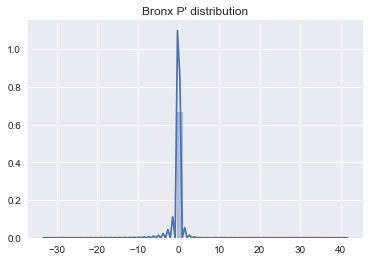

In [59]:
sns.distplot(P1_arr_bronx).set_title("Bronx P' distribution")

### Brooklyn

In [60]:
brook = union[union.Borough == "Brooklyn"]
P1_arr_brook = np.asarray(brook[["P1"]])
SD_brook = np.std(P1_arr_brook)
mean_brook = np.mean(P1_arr_brook)

In [61]:
SD_brook

0.545780221507714

In [62]:
mean_brook

0.017975615639887806

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,"Brooklyn P' distribution")

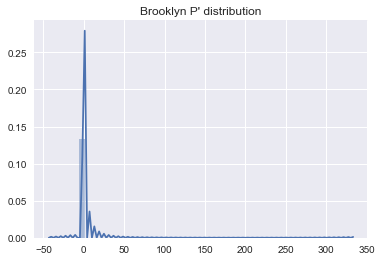

In [63]:
sns.distplot(P1_arr_brook).set_title("Brooklyn P' distribution")

### Manhattan

In [64]:
man = union[union.Borough == "Manhattan"]
P1_arr_man = np.asarray(man[["P1"]])
SD_man = np.std(P1_arr_man)
mean_man = np.mean(P1_arr_man)

In [65]:
SD_man

0.38024243637131383

In [66]:
mean_man

0.018393277866956027

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,"Manhattan P' distribution")

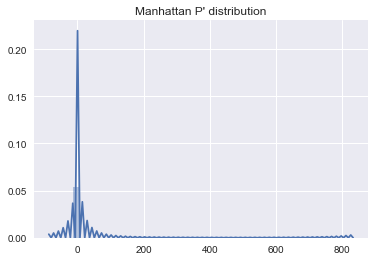

In [67]:
sns.distplot(P1_arr_man).set_title("Manhattan P' distribution")

### Queens

In [68]:
queens = union[union.Borough == "Queens"]
P1_arr_queens = np.asarray(queens[["P1"]])
SD_queens = np.std(P1_arr_queens)
mean_queens = np.mean(P1_arr_queens)

In [69]:
SD_queens

1.0032096312833776

In [70]:
mean_queens

0.0220069106192486

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,"Queens P' distribution")

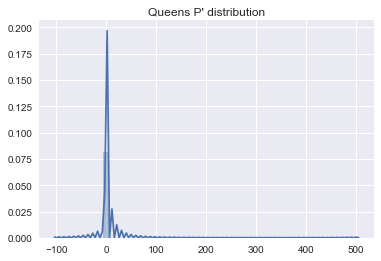

In [71]:
sns.distplot(P1_arr_queens).set_title("Queens P' distribution")

### Staten Island

In [72]:
si = union[union.Borough == "Staten Island"]
P1_arr_si = np.asarray(si[["P1"]])
SD_si = np.std(P1_arr_si)
mean_si = np.mean(P1_arr_si)

In [73]:
SD_si

1.413887093377908

In [74]:
mean_si


0.1510004806627515

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,"Staten Island P' distribution")

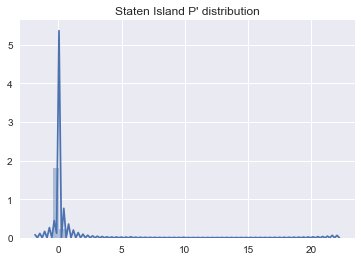

In [75]:
sns.distplot(P1_arr_si).set_title("Staten Island P' distribution")

### EWR

In [76]:
ewr = union[union.Borough == "EWR"]
P1_arr_ewr = np.asarray(ewr[["P1"]])
SD_ewr = np.std(P1_arr_ewr)
mean_ewr = np.mean(P1_arr_ewr)

In [77]:
SD_ewr

23.268843309569508

In [78]:
mean_ewr

5.652000098669978

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,"EWR P' distribution")

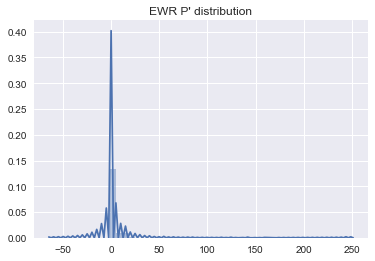

In [79]:
sns.distplot(P1_arr_ewr).set_title("EWR P' distribution")

### Unknown

In [80]:
un = union[union.Borough == "Unknown"]
P1_arr_un = np.asarray(un[["P1"]])
SD_un = np.std(P1_arr_un)
mean_un = np.mean(P1_arr_un)

In [81]:
SD_un

1.9740496117025412

In [82]:
mean_un

0.0568985653271196

/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,1,"Unknown P' distribution")

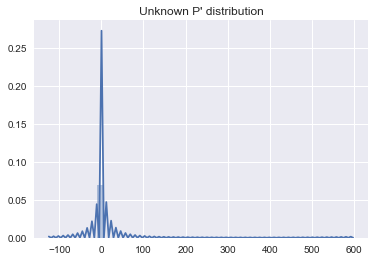

In [84]:
sns.distplot(P1_arr_un).set_title("Unknown P' distribution")

### T - Test

We repeat the same things about T-test, above the P1 arrays.

#### Bronx, Brooklyn

In [90]:
scipy.stats.ttest_ind(P1_arr_bronx,P1_arr_brook)

Ttest_indResult(statistic=array([3.31094205]), pvalue=array([0.00092987]))

#### Bronx, Manhattan

In [91]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_man)

Ttest_indResult(statistic=array([7.38822633]), pvalue=array([1.48802659e-13]))

#### Bronx, Queens

In [92]:
scipy.stats.ttest_ind(P_arr_bronx, P_arr_queens)

Ttest_indResult(statistic=array([4.24967674]), pvalue=array([2.14085048e-05]))

#### Bronx, Staten Island

In [93]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_si)

Ttest_indResult(statistic=array([-3.02576144]), pvalue=array([0.00248128]))

#### Bronx, EWR

In [94]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_ewr)

Ttest_indResult(statistic=array([-79.42384892]), pvalue=array([0.]))

#### Bronx, Unknown

In [95]:
scipy.stats.ttest_ind(P_arr_bronx,P_arr_un)

Ttest_indResult(statistic=array([-10.19512449]), pvalue=array([2.09149762e-24]))

#### Brooklyn, Manhattan

In [96]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_man)

Ttest_indResult(statistic=array([-7.94612504]), pvalue=array([1.92440181e-15]))

#### Brooklyn, Queens

In [97]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_queens)

Ttest_indResult(statistic=array([-4.09456545]), pvalue=array([4.22969322e-05]))

#### Brooklyn, Staten Island

In [98]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_si)

Ttest_indResult(statistic=array([-6.85039877]), pvalue=array([7.37073176e-12]))

#### Brooklyn, EWR

In [99]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_ewr)

Ttest_indResult(statistic=array([-256.15947075]), pvalue=array([0.]))

#### Brooklyn, Unknown

In [100]:
scipy.stats.ttest_ind(P_arr_brook,P_arr_un)

Ttest_indResult(statistic=array([-42.9587618]), pvalue=array([0.]))

#### Manhattan, Queens

In [101]:
scipy.stats.ttest_ind(P_arr_man,P_arr_queens)

Ttest_indResult(statistic=array([1.12965088]), pvalue=array([0.25862337]))

#### Manhattan, Staten Island

In [102]:
scipy.stats.ttest_ind(P_arr_man,P_arr_si)

Ttest_indResult(statistic=array([-6.25378326]), pvalue=array([4.00630201e-10]))

#### Manhattan, EWR

In [103]:
scipy.stats.ttest_ind(P_arr_man,P_arr_ewr)

Ttest_indResult(statistic=array([-455.37073875]), pvalue=array([0.]))

#### Manhattan, Unknown

In [104]:
scipy.stats.ttest_ind(P_arr_man,P_arr_un)

Ttest_indResult(statistic=array([-195.40484473]), pvalue=array([0.]))

#### Queens, Staten Island

In [105]:
scipy.stats.ttest_ind(P_arr_queens,P_arr_si)

Ttest_indResult(statistic=array([-3.55450582]), pvalue=array([0.0003787]))

#### Queens, EWR

In [106]:
scipy.stats.ttest_ind(P_arr_queens,P_arr_ewr)

Ttest_indResult(statistic=array([-243.9874751]), pvalue=array([0.]))

#### Queens, Unknown

In [107]:
scipy.stats.ttest_ind(P_arr_queens,P_arr_un)

Ttest_indResult(statistic=array([-76.17791913]), pvalue=array([0.]))

#### Staten Island, EWR

In [108]:
scipy.stats.ttest_ind(P_arr_si,P_arr_ewr)

Ttest_indResult(statistic=array([-9.05846263]), pvalue=array([3.34763358e-19]))

#### Staten Island, Unknown

In [109]:
scipy.stats.ttest_ind(P_arr_si,P_arr_un)

Ttest_indResult(statistic=array([-0.06018057]), pvalue=array([0.95201184]))

From the results, we notice that the couples Manhattan-Queens and Staten Island-Unknown have got a p-value bigger than 0.1.

It means that the boroughs of this couple are different in terms of mean of P'. 

In other words for each of these couples, there is a more expensive borough (on avarage) than the other.

In our case, for the first couple the more expensive borough is Manhattan. 

About the second couple we don't care, because the Unknown borough consists in all the unnamed boroughs in csv file for filling mistakes. So it's a irrelevant data.


# CRQ2

Our goal is to visualize taxis movements. In particular we want to know the number of trips that start and that end up in each zone, representing it with a <b>chropleth map</b>.

Let's start importing the libraries we need.

Then we consider the dataframe with PULocationID and DOLocationID columns of every month. 

At first, we want to group the dataframe by PULocationID, counting for every Pull Location the number of trips ("count_tot"). We can notice that there are some values registered as "Unknown": we drop them.

Sorting the dataframe, we can see the locations with bigger numbers of trips. Infact we see that Manhattan's zones are the areas with the biggest amounts.

Then we open the file json and we create the map (see the html file).

As we have seen form the dataframe, the darkest areas (so with the largest numbers) are in Manhattan borough and in corrispondence of Liberty Island, Governors Island and Ellis Island. Then La Guardia airport and JFK airport follow them.

It's strange to see taxis trips from the three islands. It's possible that locations are registered when a person try to call a taxi from those places, but the taxi is actually token on the mainland. Or we can also consider the possible existence of transportations by feeryboats.

We can notice, in corrispondence of IDlocation = 99 an other dark green zone, but it must be an error of data filling: infact if we go to find the count_tot for this ID, we obtain an empty df.
So, it's possible that this location is one the Unknown ones.



In [85]:
import folium as folium
import os

In [86]:
all_months = pandas.concat([jan[["PULocationID","DOLocationID"]],feb[["PULocationID","DOLocationID"]],
                            mar[["PULocationID","DOLocationID"]],apr[["PULocationID","DOLocationID"]],
                            may[["PULocationID","DOLocationID"]],june[["PULocationID","DOLocationID"]]])

In [87]:
query = all_months.groupby(['PULocationID']).size().reset_index(name="count_tot")
#dropping unknown PULocationID
query = query.drop(index=261)
query = query.drop(index=262)


In [88]:
#to visualize the locations with maximum values
no_zero = query.sort_values(["count_tot"], ascending = False)
no_zero.set_index('PULocationID').join(taxi_zone.set_index('LocationID')).head(10)

,count_tot,Borough,Zone,service_zone
PULocationID,,,,
237,2231822,Manhattan,Upper East Side South,Yellow Zone
161,2103461,Manhattan,Midtown Center,Yellow Zone
236,2040795,Manhattan,Upper East Side North,Yellow Zone
162,1891874,Manhattan,Midtown East,Yellow Zone
230,1844909,Manhattan,Times Sq/Theatre District,Yellow Zone
186,1790272,Manhattan,Penn Station/Madison Sq West,Yellow Zone
170,1736412,Manhattan,Murray Hill,Yellow Zone
234,1716835,Manhattan,Union Sq,Yellow Zone
48,1699727,Manhattan,Clinton East,Yellow Zone


In [89]:
query[query.PULocationID == 99]
#empty 99 id location

,PULocationID,count_tot


In [90]:
NYC_map = 'taxi_zones.json'

In [91]:
m = folium.Map(location=[40.7, -74], zoom_start=10)
state_data = query

m.choropleth(
    geo_data=NYC_map,
    name='choropleth',
    data=state_data,
    columns=['PULocationID', 'count_tot'],
    key_on='feature.properties.LocationID',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of pickup',
    highlight = True
)

folium.LayerControl().add_to(m)

m.save('departures.html')
m



Now, we do the same for DOLocationID, visualizing the number of taxis that arrive in the various locations.
So, we start grouping our original dataframe by DOLocationID, counting for each ID the number of trips.

Also here we drop the locations registered as unknown.

Then we create the correspondent map.

We can see that there is a dark green area (relative to ID = 110) that in our dataframe results with zero trips. It can be possible that this area has been registered as Unknown in csv file.

In general, our map shows us that some Manhattan areas, JFK airport, La Guardia airport, Liberty Island, Governors Island and Ellis Island are the ones with the largest number of trips. It's strange to see taxis trips from the three islands. It's possible that the location is registered when a person asks to stop at those places, but the taxi actually leaves the costumer near on the mainland. Or we can also consider the possible existence of transportations by feeryboats.

In [92]:
query2 = all_months.groupby(['DOLocationID']).size().reset_index(name="count_tot")
query2 = query2.drop(index=261)
query2 = query2.drop(index=262)
query2[query2.DOLocationID == 110]

,DOLocationID,count_tot


In [93]:
m = folium.Map(location=[40.7, -74], zoom_start=10)
state_data = query2

m.choropleth(
    geo_data=NYC_map,
    name='choropleth',
    data=state_data,
    columns=['DOLocationID', 'count_tot'],
    key_on='feature.properties.LocationID',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of drop',
    highlight = True
)

folium.LayerControl().add_to(m)
m.save('arrivals.html')
m